In [1]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import torch
from botorch.utils.transforms import unnormalize
from matplotlib.colors import Normalize, ListedColormap
from matplotlib.lines import Line2D

from utils.data_processing import find_pt_files
from utils.plotting import plot_contour, plot_with_filled_rectangle

In [2]:

def problem_algo_scatter(problem, algo, compare_algo=None, stop=10):
    # Define the possible values for each parameter
    experiments_path = f'./experiments/{problem}/2D/{algo}'

    pt_files = find_pt_files(experiments_path, filter='11' if problem == 'ackley' else '00')

    selected_files = pt_files[:stop] if stop is not None else pt_files
    for f in selected_files:
        try:
            # Load the data
            data = torch.load(f, weights_only=False)
        except Exception as e:
            print(f"Error loading file: {f}")
            raise e

        X_norm = data['X']
        obj = data['base_function']
        delay = data['delay_factor']
        run = data['seed']

        # Unnormalize the data
        X = unnormalize(X_norm, obj.bounds)

        # Plot the scatter plot
        fig, ax = plt.subplots(figsize=(8, 6))
        ax = plot_contour(ax, obj)
        indices = np.arange(len(X))  # [0, 1, 2, ..., n]
        # Normalize the indices to range between 0 and 1 for the color map
        norm = Normalize(vmin=0, vmax=len(X) - 1)
        cmap = mpl.colormaps['Blues']
        scatter1 = ax.scatter(X[:, 0], X[:, 1], marker='o', c=indices,
                              cmap=cmap, norm=norm,
                              )
        
        first_handles = [Line2D([0], [0], marker='o', color=cmap(0.9), linestyle='None')]
        first_labels = ['BO' if algo == 'ei' else 'CMA-ES' if algo == 'cmaes' else 'Sobol']

        if compare_algo:
            compare_f = f.replace(algo, compare_algo)
            # Load the data
            data_f = torch.load(compare_f, weights_only=False)
            compare_X_norm = data_f['X']
            compare_X = unnormalize(compare_X_norm, obj.bounds)
            
            cmap2 = mpl.colormaps['Oranges']
            scatter2 = ax.scatter(compare_X[:, 0], compare_X[:, 1], marker='x', c=indices,
                              cmap=cmap2, norm=norm,
                              )
            first_handles.append(Line2D([0], [0], marker='x', color=cmap2(0.9), linestyle='None'))
            first_labels.append('BO' if compare_algo == 'ei' else 'CMA-ES' if compare_algo == 'cmaes' else 'Sobol')

        # Create the Greys colormap and modify its alpha values (transparency)
        cmap_greys = plt.get_cmap('Greys')  # Start with the 'Greys' colormap
        colors = cmap_greys(np.linspace(0, 1, 256))  # Get RGBA values for the colormap
        colors[:, -1] = 0.6  # Modify the alpha channel (the last column) to set transparency
        cmap_greys_with_alpha = ListedColormap(colors)  # Create a new colormap with the modified alpha

        # Create a ScalarMappable using the modified colormap with transparency
        sm = plt.cm.ScalarMappable(cmap=cmap_greys_with_alpha, norm=norm)
        sm.set_array([])  # ScalarMappable requires an array
        cbar = fig.colorbar(sm, ax=ax)
        cbar.set_label('Point Order')

        schema = data['constraint']
        constraint_lb = torch.tensor([0.5 if c == '1' else 0. for c in schema],)
        constraint_ub = torch.tensor([0.5 if c == '0' else 1. for c in schema],)
        constraint_bounds_norm = torch.stack([constraint_lb, constraint_ub], dim=0)
        constraint_bounds = unnormalize(constraint_bounds_norm, obj.bounds).T

        # Plot the constraint region
        ax = plot_with_filled_rectangle(ax, constraint_bounds[0], constraint_bounds[1])

        # Plot the problem solution
        ax.plot(*obj._optimizers[0], 'o', color='red', label='Global optima')

        # Add the legend after all components
        # Set the plot title
        title_text = f'{obj._get_name()} run {run}' if schema is None or delay is None else f'{obj._get_name()} run {run} with {schema} schema and {delay} delay'
        ax.set_title(title_text)

        # Set axis labels
        ax.set_xlabel('x')
        ax.set_ylabel('y')

        # Customizing the legend with explicit handles and labels
        handles, labels = ax.get_legend_handles_labels()  # Get existing handles and labels

        # Prepend the custom marker and label to the existing ones
        handles = first_handles + handles
        labels = first_labels + labels

        # Now pass the custom labels and handles to ax.legend()
        ax.legend(handles, labels, loc='upper left')

        # Show plot
        plt.show()

        # Close the figure after it has been displayed
        plt.close(fig)

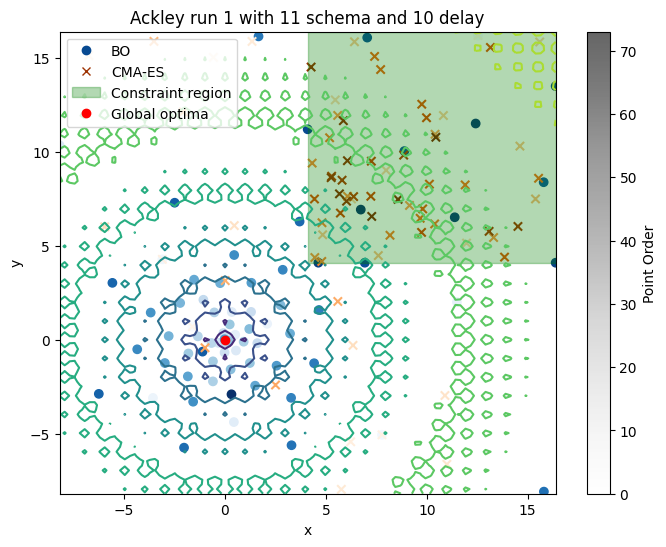

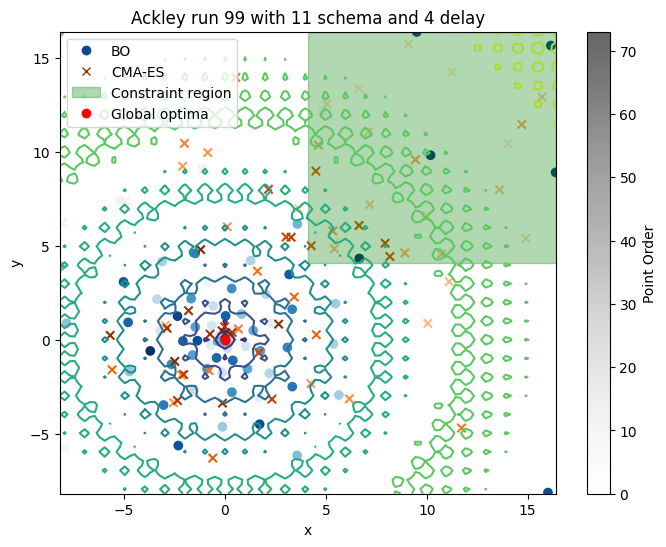

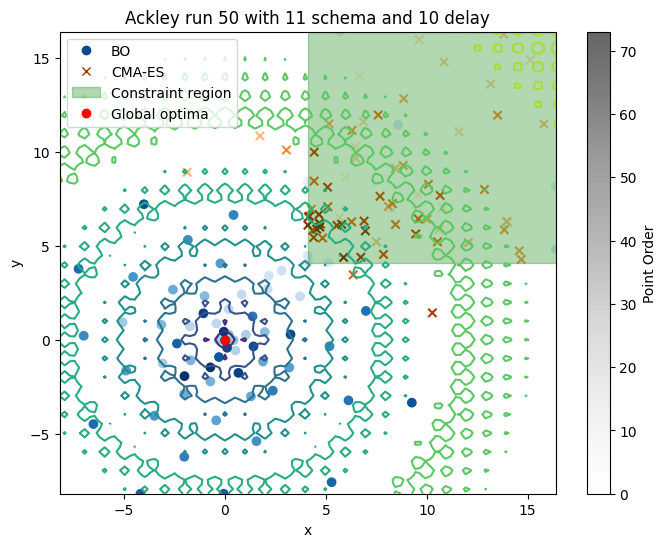

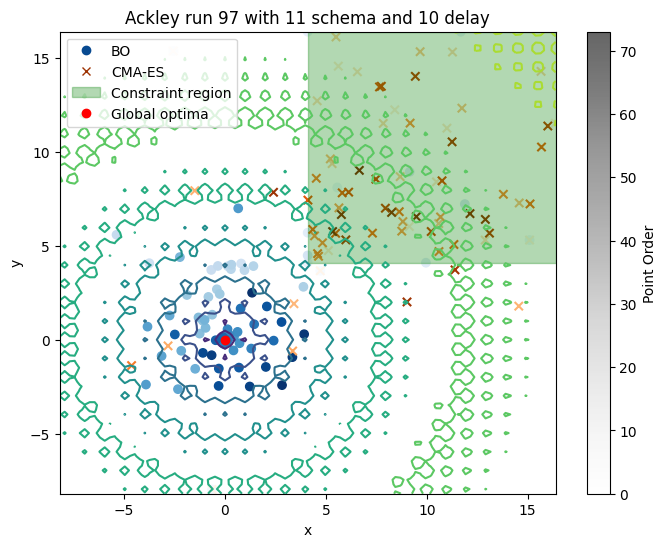

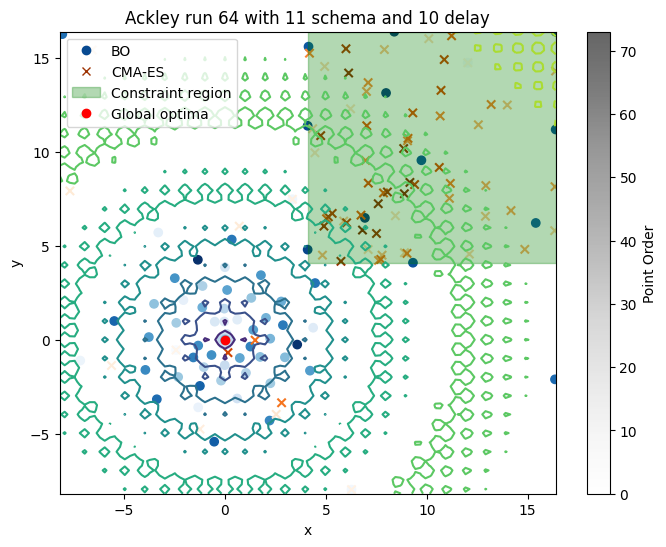

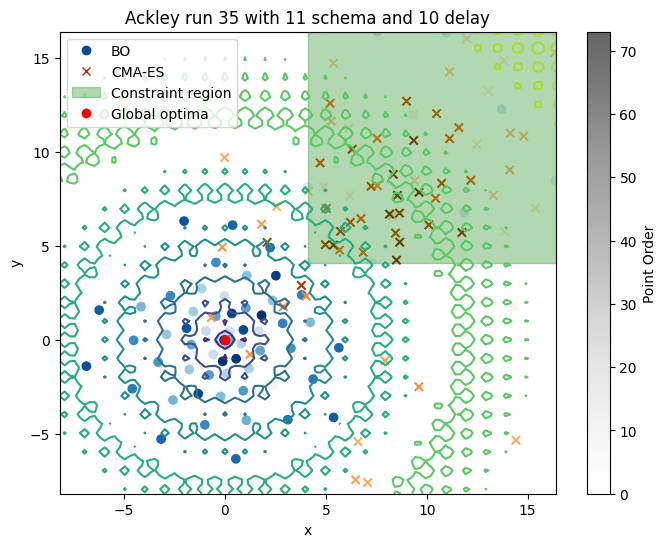

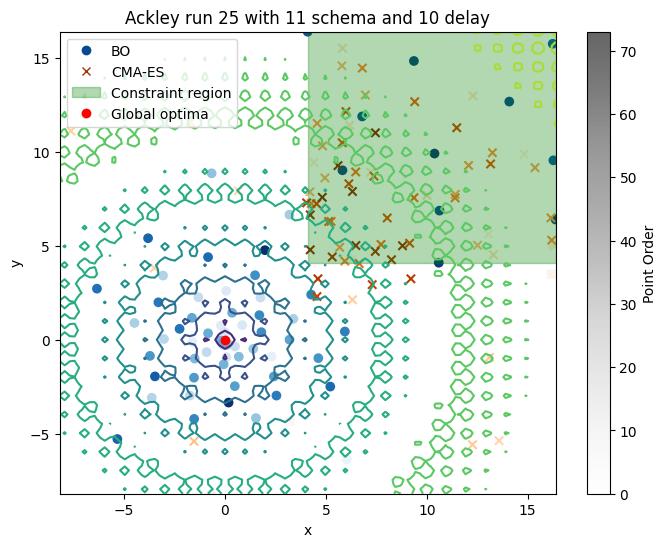

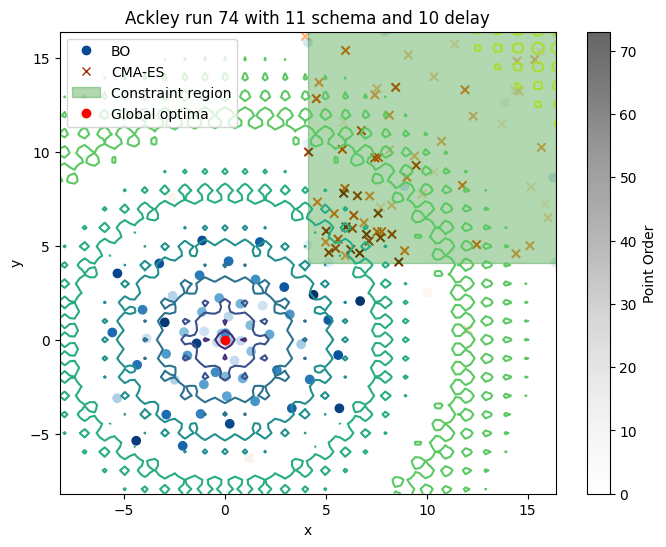

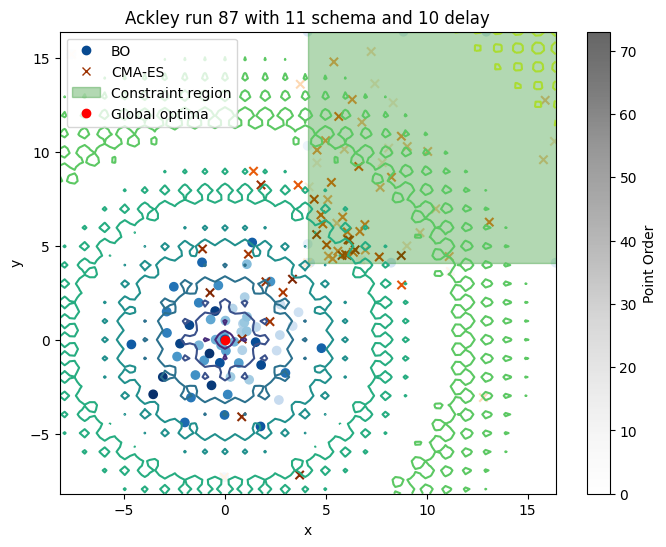

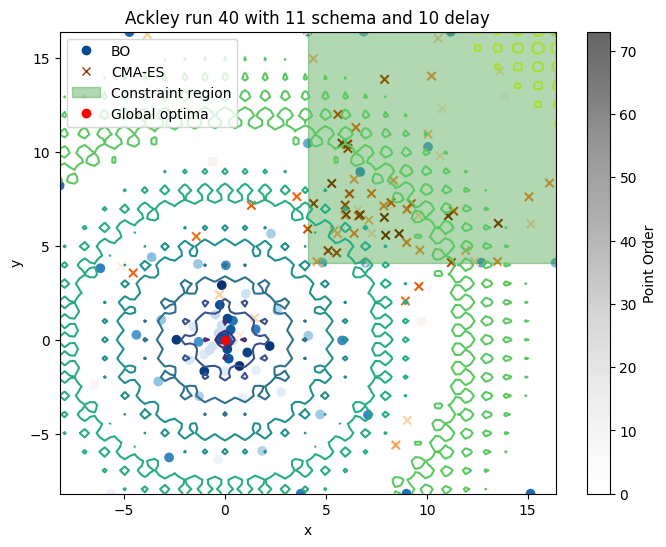

In [3]:
problem_algo_scatter('ackley', algo='ei', compare_algo='cmaes',
                     stop=None
                     )

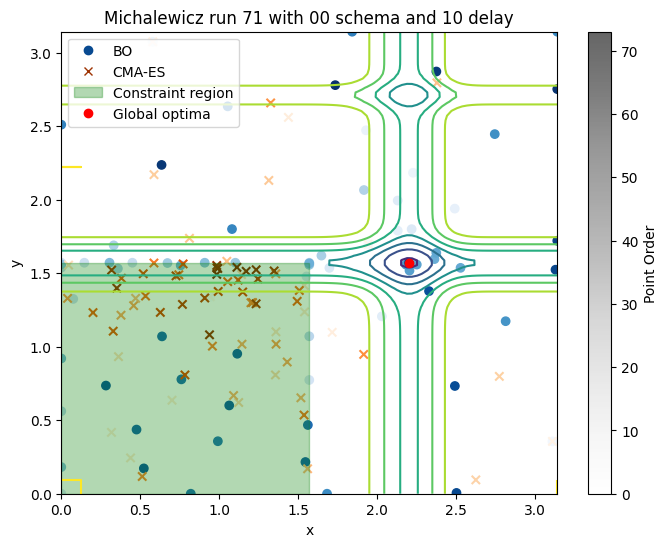

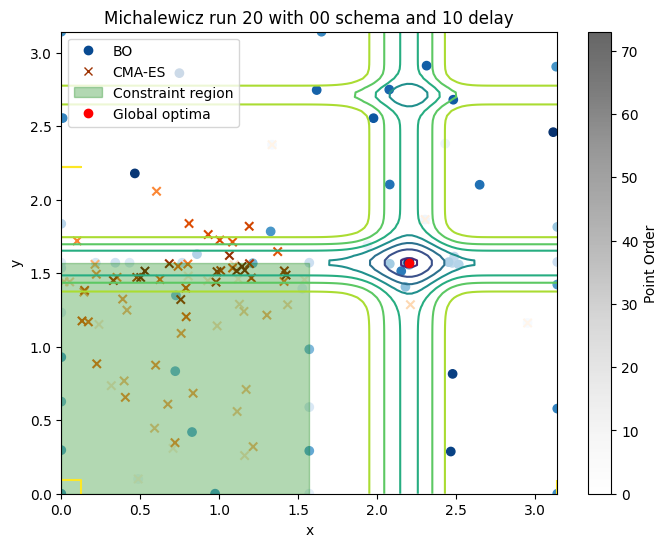

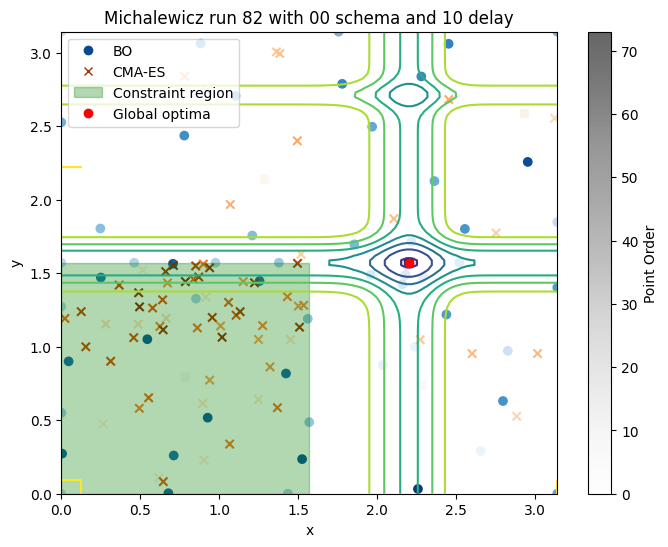

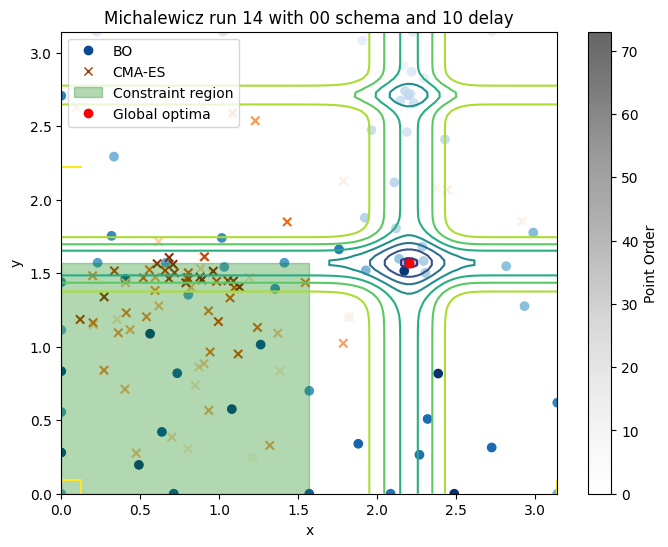

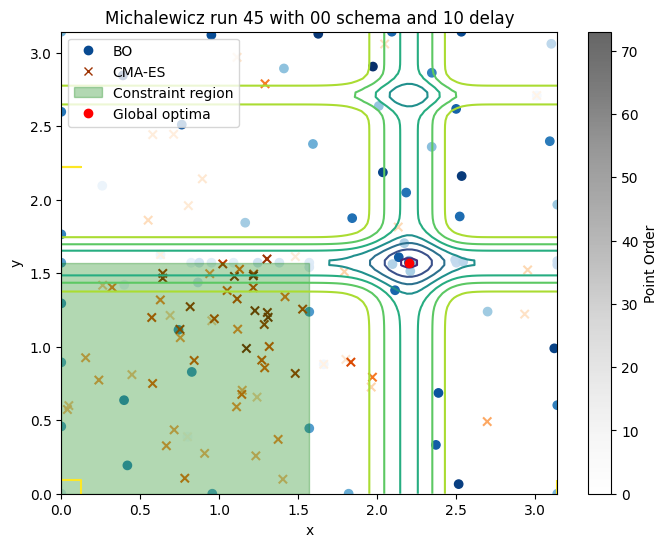

...

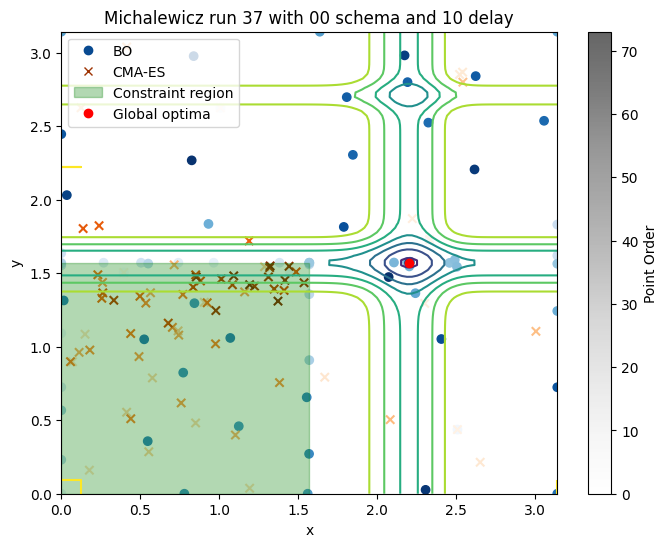

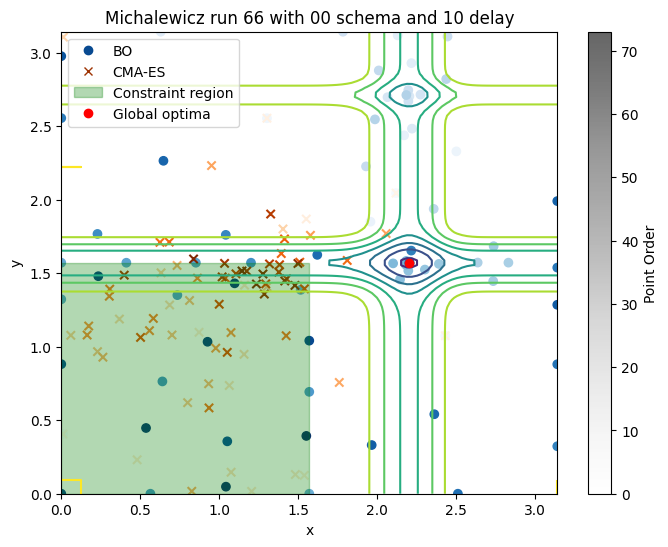

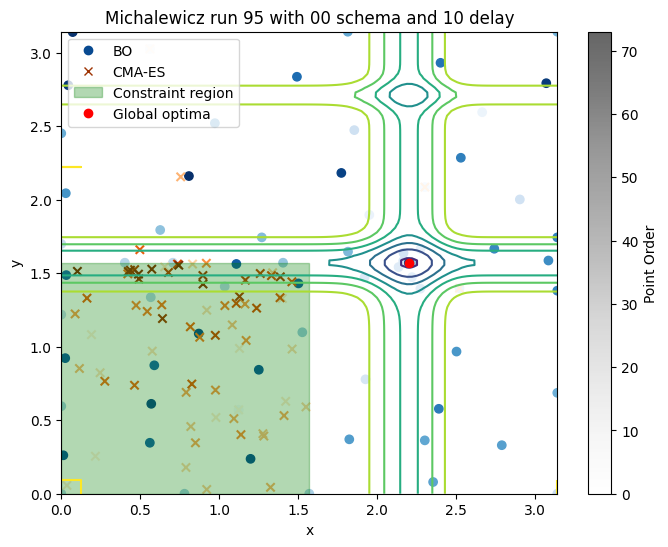

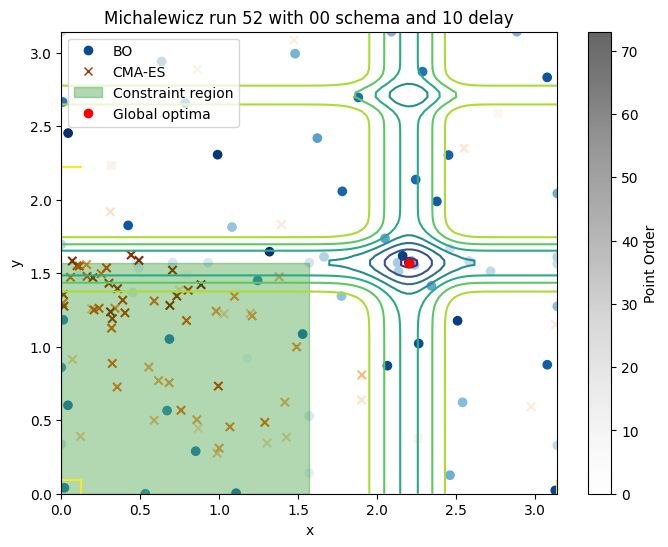

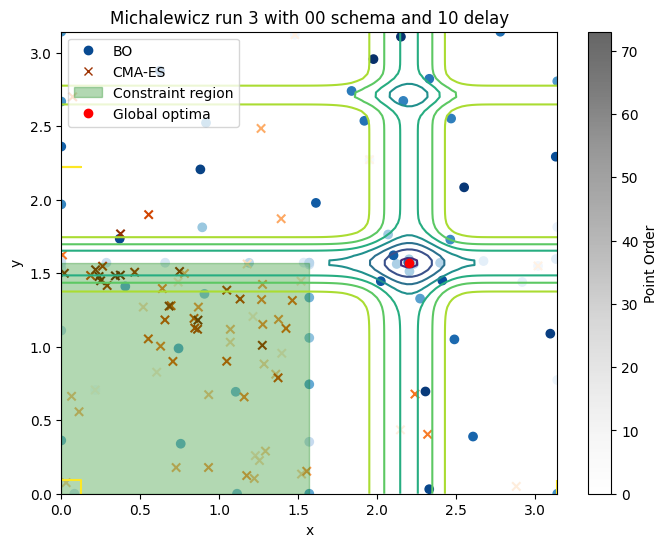

In [3]:
problem_algo_scatter('michalewicz', algo='ei', compare_algo='cmaes',
                     stop=None
                     )